In [ ]:
!unzip Test.zip -d data >> /dev/null # 解压压缩包
!rm -rf Test.zip # 删除压缩包

In [ ]:
!rm -rf Test Captions_.xlsx

In [1]:
import scipy.io
from PIL import Image
# 加载 .mat 文件
mat_file_path = 'data/Test/Labels/1387143-25-204543.mat'
data = scipy.io.loadmat(mat_file_path)
jpg_file_path = 'data/Test/images/1387143-25-204543.jpg'
# 查看 .mat 文件的内容
print(data)


{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Oct  3 22:51:55 2023', '__version__': '1.0', '__globals__': [], 'Four_points': array([[ 640.81164871,  965.12671579],
       [1126.06574666,  965.90089893],
       [ 621.48112208,  903.28066381],
       [1142.26140804,  902.25952599],
       [  56.93243979,   54.86130944]]), 'Angles': array([[107.4485035 , 104.18633614]])}


In [2]:
four_points = data['Four_points']
angles = data['Angles']

print("Four_points:")
print(four_points)

print("Angles:")
print(angles)

Four_points:
[[ 640.81164871  965.12671579]
 [1126.06574666  965.90089893]
 [ 621.48112208  903.28066381]
 [1142.26140804  902.25952599]
 [  56.93243979   54.86130944]]
Angles:
[[107.4485035  104.18633614]]


In [3]:
left_head = four_points[2]
right_head = four_points[3]
center1 = four_points[0]
center2 = four_points[1]
radius1 = four_points[4][0]
radius2 = four_points[4][1]

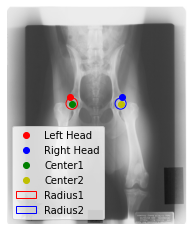

In [4]:
import matplotlib.pyplot as plt
import numpy as np

image = Image.open(jpg_file_path)
image_array = np.array(image)

# 在图像上绘制点和圆
plt.imshow(image_array)
plt.scatter(left_head[0], left_head[1], c='r', label='Left Head')  # 绘制左头点，使用红色（'r'）表示
plt.scatter(right_head[0], right_head[1], c='b', label='Right Head')  # 绘制右头点，使用蓝色（'b'）表示
plt.scatter(center1[0], center1[1], c='g', label='Center1')  # 绘制中心点1，使用绿色（'g'）表示
plt.scatter(center2[0], center2[1], c='y', label='Center2')  # 绘制中心点2，使用黄色（'y'）表示

# 绘制半径为radius1和radius2的圆
circle1 = plt.Circle((center1[0], center1[1]), radius1, color='r', fill=False, label='Radius1')
circle2 = plt.Circle((center2[0], center2[1]), radius2, color='b', fill=False, label='Radius2')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)

plt.axis('off')  # 隐藏坐标轴
plt.legend()  # 显示图例
plt.show()

In [5]:
import json
import os
from PIL import Image
import scipy.io

coco = {}

In [6]:
#class_list= {
#    'supercategory': 'sjb_rect',
#    'id': 1,
#    'name': 'sjb_rect',
#    'keypoints': ['left_top', 'right_top', 'left_bottom', 'right_bottom'], # 大小写敏感
#    'skeleton':[[0,2], [1,3], [2,3]]
#}



In [7]:

coco = {
   
    "categories": [
        {
            "id": 1,
            "name": "cranial acetabulum",
            "supercategory": "none",
            "keypoints": ["left","right"],
            "skeleton": []
        },
    ],
    "images": [],
    "annotations": []
}



IMG_ID = 0
ANN_ID = 0

In [8]:
import json
import os
import scipy.io
import numpy as np
from PIL import Image



def process_single_image(mat_data, image_id, four_points, radii):
    global ANN_ID
    coco_annotations = []
    
    # 获取第cranial_acetabulum的关键点和边界框
    left = four_points[2]
    right = four_points[3]
    
    min_x1 = left[0]
    max_x1 = right[0] 
    min_y1 = min(left[1], right[1])
    max_y1 = max(left[1], right[1])
    bbox_w1 = max_x1 - min_x1
    bbox_h1 = max_y1 - min_y1

    
    bbox_dict1 = {
        'category_id': 1,
        'iscrowd': 0,
        'image_id': image_id,
        'id': ANN_ID,
        'bbox': [min_x1, min_y1, bbox_w1, bbox_h1],
        'area': bbox_w1 * bbox_h1,
        'segmentation': [],
        'keypoints': [left[0], left[1], 2, right[0], right[1], 2],
        'num_keypoints': 2
    }
    ANN_ID += 1
    

    coco_annotations.append(bbox_dict1)

    
    
    return coco_annotations



In [9]:
annotations =process_single_image(data,1,four_points[:4],four_points[4:][0])

In [10]:
annotations

[{'category_id': 1,
  'iscrowd': 0,
  'image_id': 1,
  'id': 0,
  'bbox': [621.4811220819104,
   902.259525993113,
   520.7802859558951,
   1.0211378155996726],
  'area': 531.7884436083756,
  'segmentation': [],
  'keypoints': [621.4811220819104,
   903.2806638087127,
   2,
   1142.2614080378055,
   902.259525993113,
   2],
  'num_keypoints': 2}]

In [11]:
IMG_ID = 0
ANN_ID = 0

In [12]:
def create_coco_dataset(image_dir, mat_dir, output_file):
    global IMG_ID
    global coco
    image_files = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    mat_files = sorted([f for f in os.listdir(mat_dir) if f.endswith('.mat')])
    
    print(f"Total number of images in {image_dir}: {len(image_files)}")
    
    for image_file, mat_file in zip(image_files, mat_files):
            # 加载图片
            image_path = os.path.join(image_dir, image_file)
            image = Image.open(image_path)
            width, height = image.size

            # 加载 .mat 文件
            mat_file_path = os.path.join(mat_dir, mat_file)
            data = scipy.io.loadmat(mat_file_path)
            four_points = data['Four_points'][:4]
            radii = data['Four_points'][4:][0]

            # 添加图像信息
            coco["images"].append({
                "id": IMG_ID,
                "file_name": image_file,
                "width": width,
                "height": height
            })

            # 处理单个图像的注释
            annotations = process_single_image(data, IMG_ID, four_points, radii)
            coco["annotations"].extend(annotations)

            IMG_ID += 1
        
        
    print(f"Total number of processed images: {len(coco['images'])}")
    
    # 保存为 COCO 格式的 JSON 文件
    with open(output_file, 'w') as f:
        json.dump(coco, f, indent=4)
        
    return coco

# 使用示例
#image_dir = 'data/Test/Images'
#mat_dir = 'data/Test/Labels'
#output_file = 'data/Test/cocoLabels_center.json'

#coco_data = create_coco_dataset(image_dir, mat_dir, output_file)

In [13]:
from matplotlib import patches
category_colors = {
    1: 'g',  # cranial acetabulum
    2: 'b'   # center
}
keypoint_colors = {
    1: ['r', 'y'],  # cranial acetabulum, 两个关键点分别是红色和黄色
    2: ['m']        # center，关键点是品红色
}
def plot_coco_annotations(coco, image_dir):
    for image_info in coco["images"]:
        image_id = image_info["id"]
        image_file = image_info["file_name"]
        image_path = os.path.join(image_dir, image_file)
        image = Image.open(image_path)
        
        fig, ax = plt.subplots(figsize=(10, 10))  # 增大图片显示尺寸
        ax.imshow(image)
        ax.set_aspect('equal', 'box')

        # 画出每个注释
        for annotation in coco["annotations"]:
            if annotation["image_id"] == image_id:
                bbox = annotation['bbox']
                keypoints = annotation['keypoints']
                category_id = annotation['category_id']
                
                # 根据类别选择颜色
                bbox_color = category_colors.get(category_id, 'r')  # 默认为红色
                
                # 画边界框
                rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=bbox_color, facecolor='none')
                ax.add_patch(rect)

                # 画关键点
                num_keypoints = annotation['num_keypoints']
                kp_colors = keypoint_colors.get(category_id, ['r'])  # 默认为红色
                for i in range(num_keypoints):
                    x = keypoints[3 * i]
                    y = keypoints[3 * i + 1]
                    v = keypoints[3 * i + 2]
                    if v > 0:  # 如果关键点可见
                        kp_color = kp_colors[i % len(kp_colors)]
                        ax.plot(x, y, 'o', color=kp_color, markersize=5)

        plt.title(f'Image ID: {image_id}')
        plt.axis('off')
        plt.show()

In [14]:
image_dir = '/home/featurize/work/Dataset2/data/Testing/Images'
mat_dir = '/home/featurize/work/Dataset2/data/Testing/Labels'
output_file = '/home/featurize/work/Dataset2/data/Testing/cocoLabels_cranial_acetabulum.json'

coco_data = create_coco_dataset(image_dir, mat_dir, output_file)
#plot_coco_annotations(coco_data, image_dir)

Total number of images in /home/featurize/work/Dataset2/data/Testing/Images: 121
Total number of processed images: 121


Total number of images in /home/featurize/work/Dataset2/data/Validation/Images: 105
Total number of processed images: 105


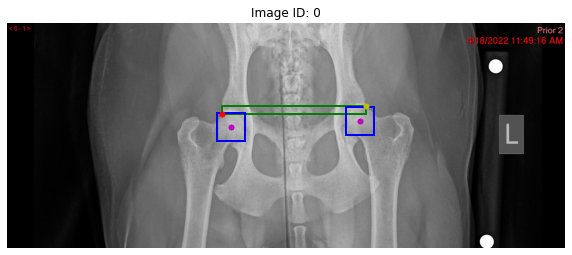

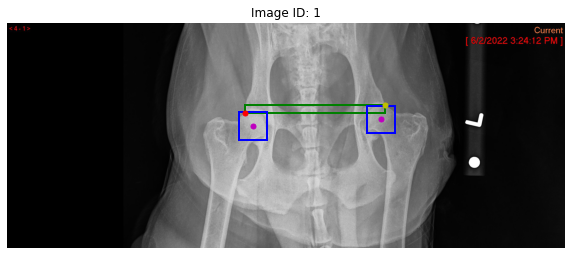

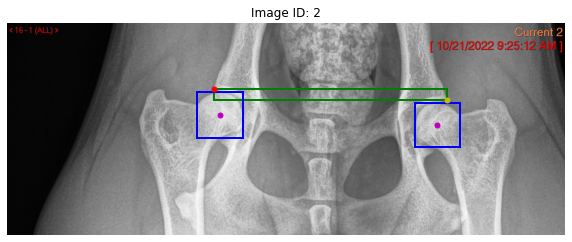

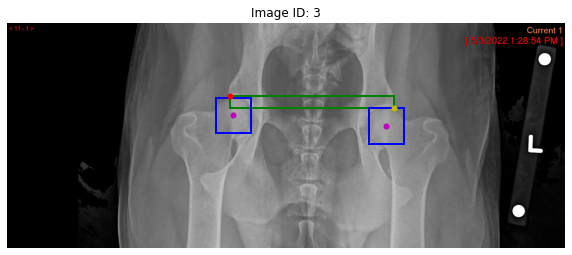

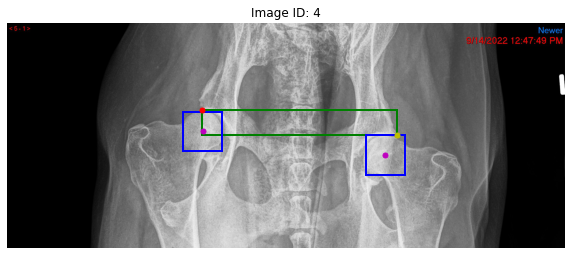

...

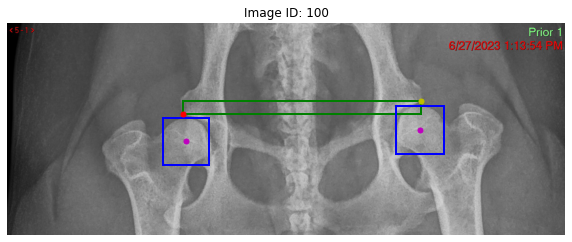

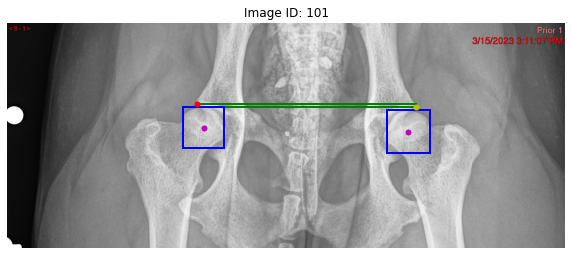

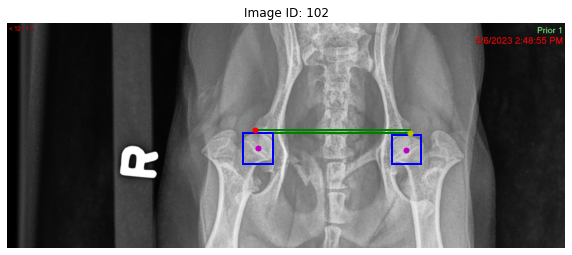

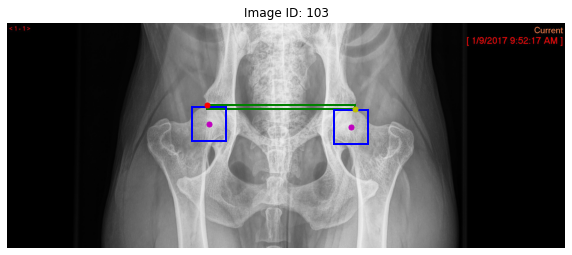

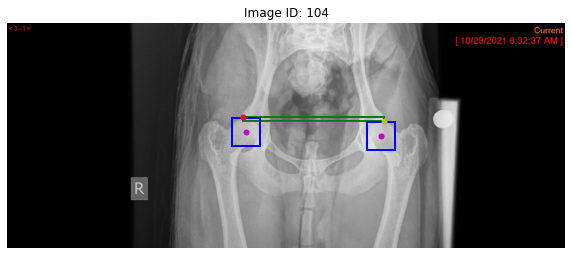

In [13]:
import matplotlib.pyplot as plt
import numpy as np
image_dir = '/home/featurize/work/Dataset2/data/Validation/Images'
mat_dir = '/home/featurize/work/Dataset2/data/Validation/Labels'
output_file = '/home/featurize/work/Dataset2/data/Validation/cocoLabels_cranial_acetabulum.json'

coco_data_valid = create_coco_dataset(image_dir, mat_dir, output_file)
plot_coco_annotations(coco_data_valid, image_dir)